# APRENDIZAJE AUTOMÁTICO - EVALUACIÓN

Dado el dataset Rice que contiene información de dos tipos de arroces (en archivo adjunto Citation_Request.txt se lo describe) , el cual se comparte en el siguiente link (también pueden encontrar archivo csv. adjunto):

https://docs.google.com/spreadsheets/d/e/2PACX-1vR2JTCQKzRmjSJBUvu7OOrcBceJcdVbyU1NMdzbThKKcEgiJQ55PH1AfpzQGvbAV1Om6uz-PsOrgn5i/pub?gid=521645460&single=true&output=csv


Se solicita:

El problema a resolver es realizar un modelo supervisado que clasifique las instancias en 2 clases:  Osmancik o Cammeo

1. Realizar un análisis exploratorio de los datos, se deberá describir la información que considera relevante de los datos.

2. Seleccionar el modelo y los atributos de entrada justificando su selección.

3. Particionar y entrenar el modelo elegido

4. Predecir y evaluar la calidad del modelo, enunciando las conclusiones.

Para la calificación se tendrá en cuenta las descripciones, justificaciones y conclusiones realizadas.

---

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import f_oneway
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn import tree, metrics
from sklearn.tree import DecisionTreeClassifier #Arboles de decisión para Clasificaciòn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.tree import plot_tree


#@title Importar datos y liberías
df = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vR2JTCQKzRmjSJBUvu7OOrcBceJcdVbyU1NMdzbThKKcEgiJQ55PH1AfpzQGvbAV1Om6uz-PsOrgn5i/pub?gid=521645460&single=true&output=csv')

# Exploración

In [2]:
#@title Forma del DataSet

print(f"El Dataset Rice tiene {df.shape[0]} filas y {df.shape[1]} columnas.")

El Dataset Rice tiene 3810 filas y 8 columnas.


In [3]:
#@title Columnas del Dataset

print("Las columnas del Dataset son: \n")
print(df.columns)

Las columnas del Dataset son: 

Index(['Area', 'Perimeter', 'Major_Axis_Length', 'Minor_Axis_Length',
       'Eccentricity', 'Convex_Area', 'Extent', 'Class'],
      dtype='object')


In [4]:
#@title Tipo de dato de las columnas

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3810 entries, 0 to 3809
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Area               3810 non-null   int64  
 1   Perimeter          3810 non-null   float64
 2   Major_Axis_Length  3810 non-null   float64
 3   Minor_Axis_Length  3810 non-null   float64
 4   Eccentricity       3810 non-null   float64
 5   Convex_Area        3810 non-null   int64  
 6   Extent             3810 non-null   float64
 7   Class              3810 non-null   object 
dtypes: float64(5), int64(2), object(1)
memory usage: 238.2+ KB


Todas las columnas son continuas.
La única columna categórica es la variable objetivo.

In [5]:
#@title Revisión de valores nulos

df.isnull().sum()

Area                 0
Perimeter            0
Major_Axis_Length    0
Minor_Axis_Length    0
Eccentricity         0
Convex_Area          0
Extent               0
Class                0
dtype: int64

Ninguna columna presenta valores nulos.

In [6]:
#@title Valores de la variable objetivo

df['Class'].unique()

array(['Cammeo', 'Osmancik'], dtype=object)

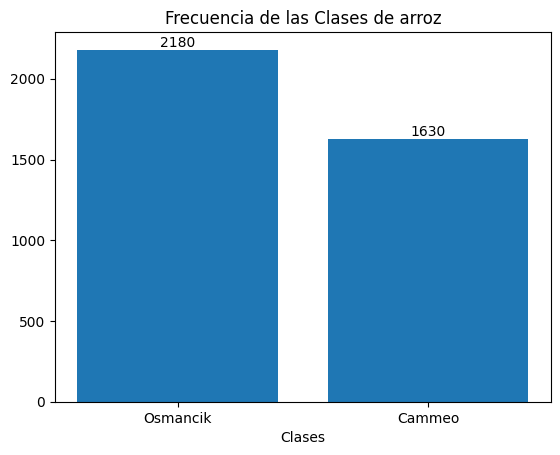

In [7]:
# Crear el gráfico de barras
plt.bar(df['Class'].value_counts().index,
        df['Class'].value_counts().values)

# Agregar etiquetas
plt.xlabel('Clases')
plt.title('Frecuencia de las Clases de arroz')

# Agregar etiquetas de cantidad en las barras
for i, count in enumerate(df['Class'].value_counts().values):
    plt.text(i, count, str(count), ha='center', va='bottom')

# Mostrar el gráfico
plt.show()


Las posibles variables predictoras son Continuas, la variable objetivo es Categórica.

Existen solo dos valores posibles para la variable objetivo.

---

# Análisis uni-variado

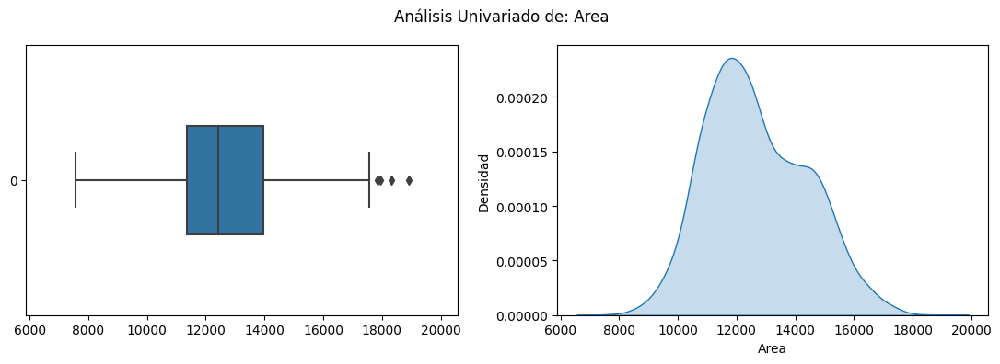

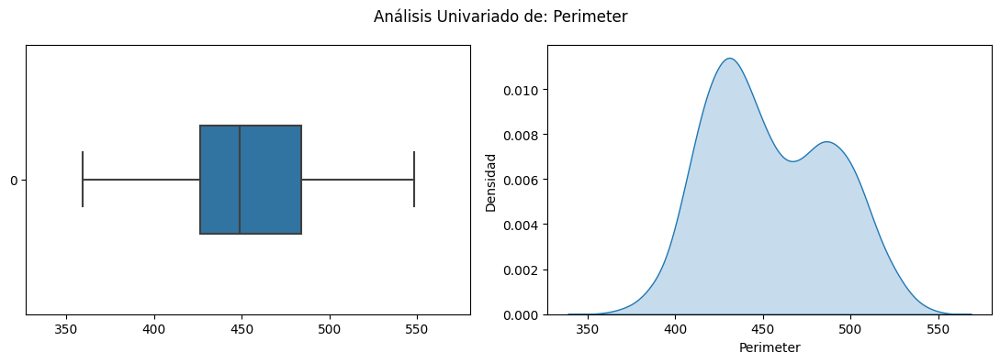

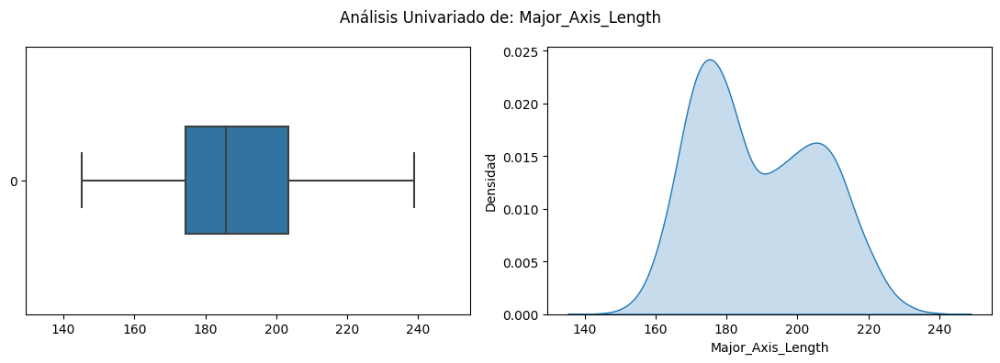

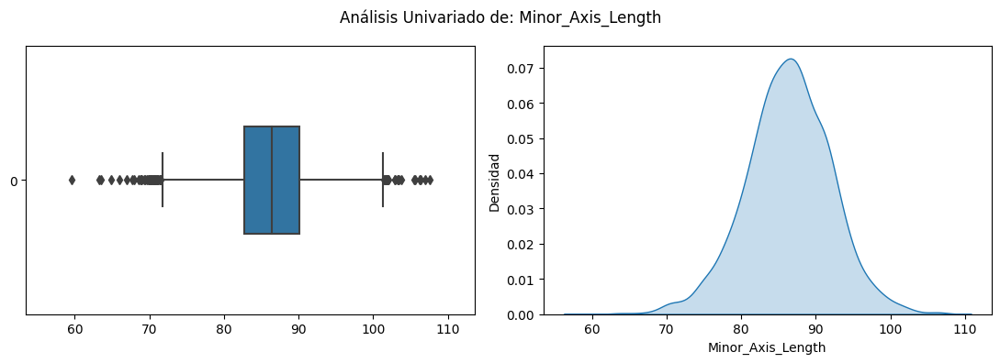

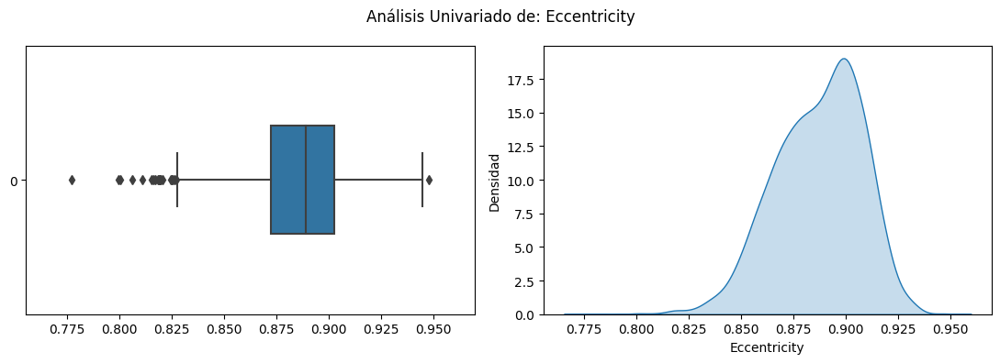

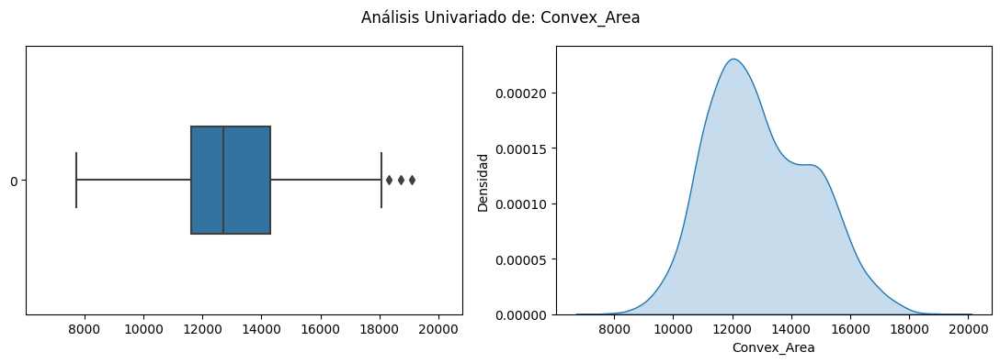

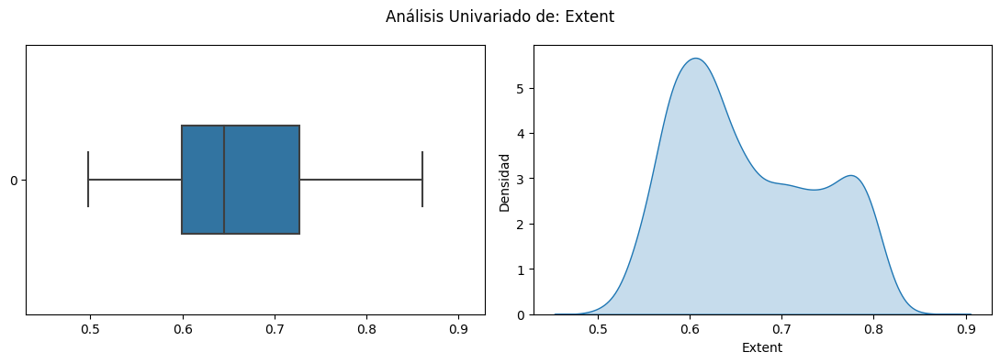

In [8]:
for column in df.columns[:-1]:

    # Ajustes de la figura de Matplotlib
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(11, 4), sharex=True)

    # Plotea el boxplot
    sns.boxplot(data=df[column], ax=ax[0], orient='h', width=0.4)

    # Plotea la curva de densidad
    sns.kdeplot(data=df[column], ax=ax[1], fill=True)
    ax[1].set_ylabel('Densidad')

    fig.suptitle('Análisis Univariado de: ' + column)

    plt.tight_layout()

La mayoría de las variables de entrada presentan valores atípicos y concentran gran parte de sus valores en el tercer cuartil.

El análisis continúa contemplando la variable objetivo _Class_.


---


# Análisis bi- variado

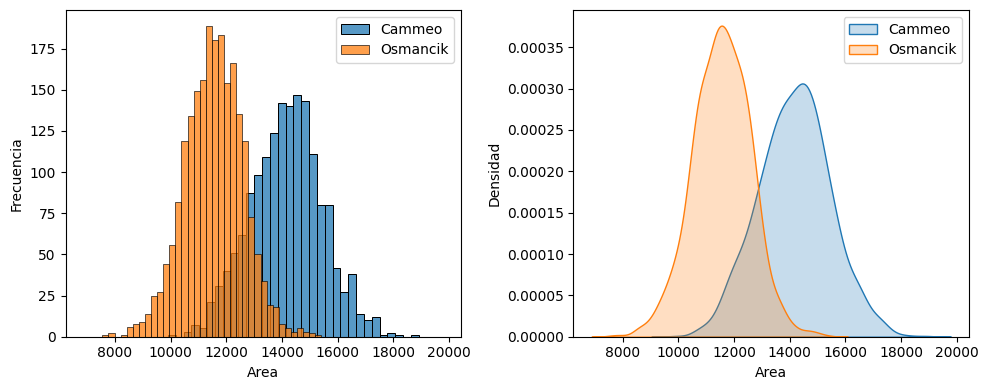

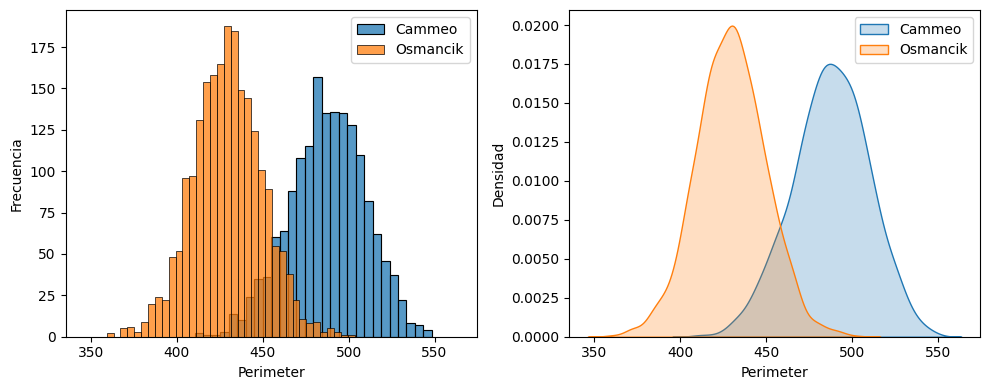

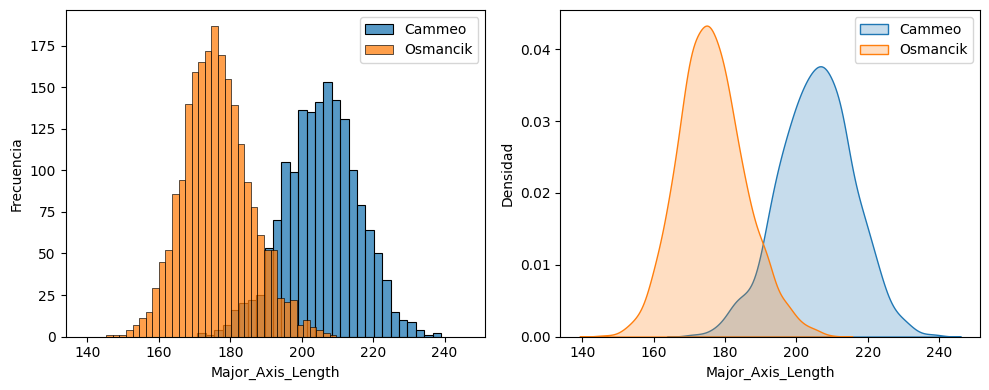

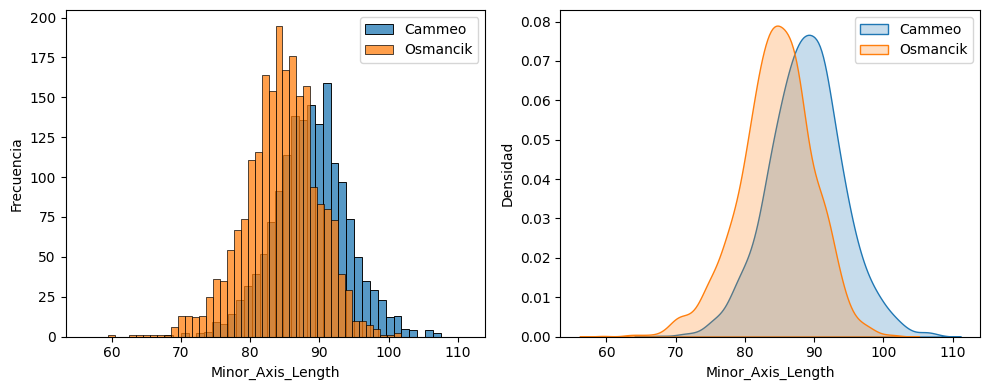

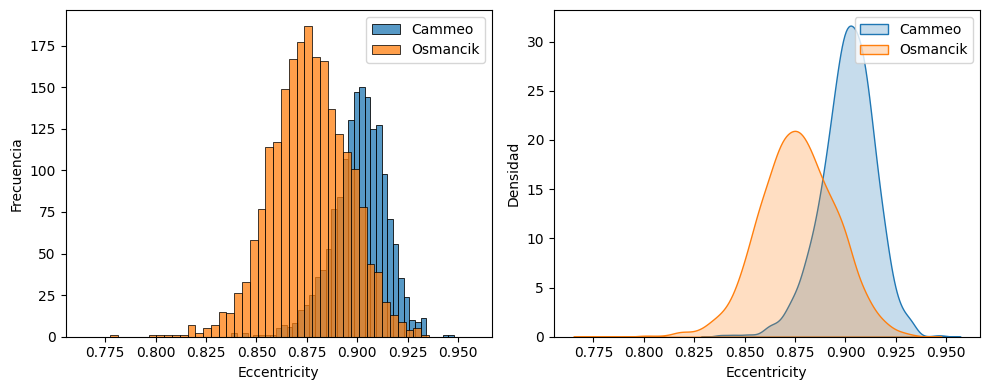

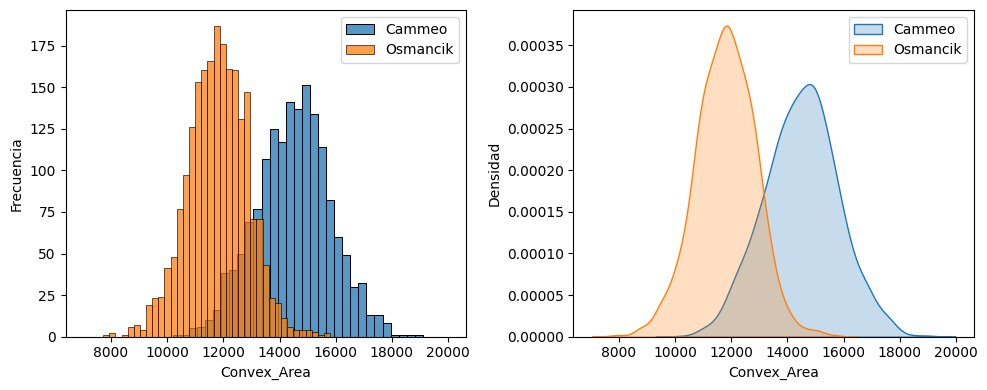

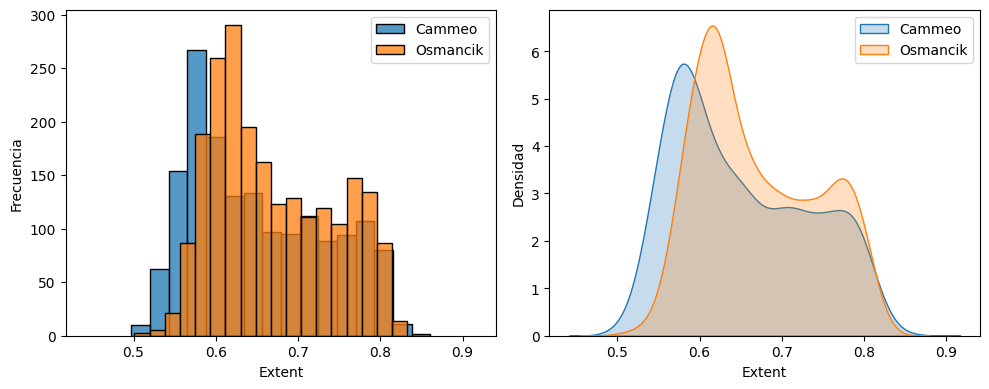

In [9]:
for column in df.columns[:-1]:

    # Ajustes de la figura de Matplotlib
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4), sharex=True)

    # Histograma para cada especie
    sns.histplot(data=df.loc[(df['Class'] == df['Class'].unique()[0])], x=column, label=df['Class'].unique()[0], kde=False, ax=ax[0])
    sns.histplot(data=df.loc[(df['Class'] == df['Class'].unique()[1])], x=column, label=df['Class'].unique()[1], kde=False, ax=ax[0])
    ax[0].set_ylabel('Frecuencia')
    ax[0].legend()

    # Curva de densidad para cada especie
    sns.kdeplot(data=df.loc[(df['Class'] == df['Class'].unique()[0])], x=column, label=df['Class'].unique()[0], fill=True, ax=ax[1])
    sns.kdeplot(data=df.loc[(df['Class'] == df['Class'].unique()[1])], x=column, label=df['Class'].unique()[1], fill=True, ax=ax[1])
    ax[1].set_ylabel('Densidad')
    ax[1].legend()

    plt.tight_layout()

La densidad de cada clase en las variables _Minor_Axis_Length_ y _Extent_ presentan una forma muy parecida. Se podría interpretar que no serían las mejores variables predictoras para la variable objetivo.


---

# Análisis multi-variado

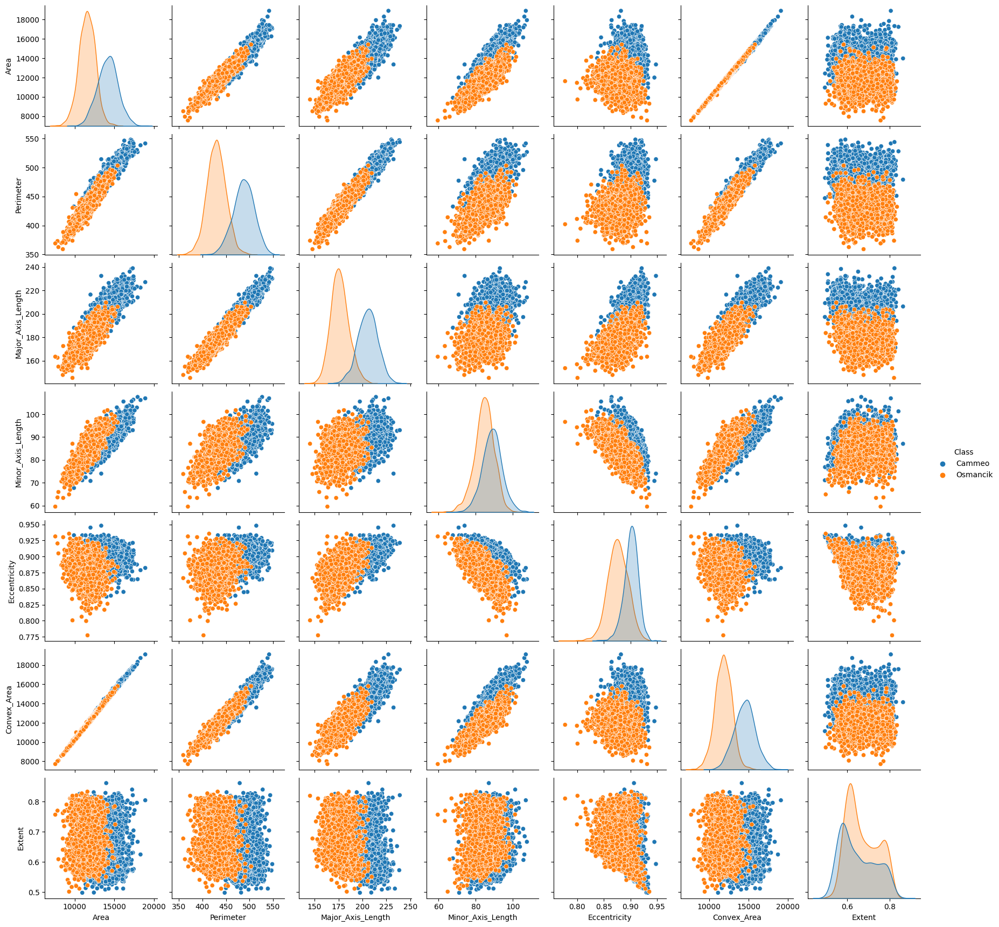

In [10]:
sns.pairplot(df, hue='Class')

# Selección de atributos

Para encontrar las mejores variables que mejor predigan la variable objetivo se realizará:
* Correlación entre las entradas
* Método de filtro: ANOVA

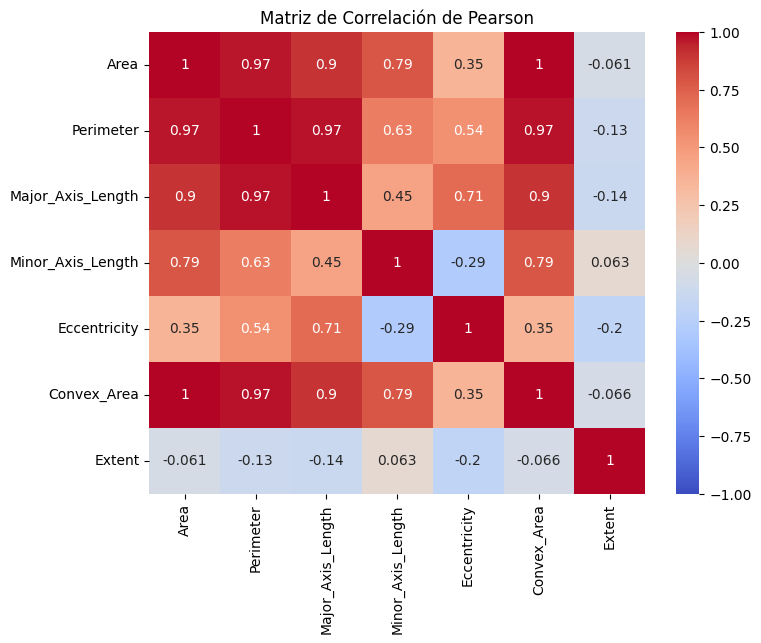

In [11]:
#@title Correlaciones

df_corr = df.corr(numeric_only=True)

plt.figure(figsize=(8, 6))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Matriz de Correlación de Pearson")
plt.show()

In [33]:
#@title Método de filtro: ANOVA

for column in df.columns[:-1]:
    f_statistic, p_value = stats.f_oneway(df.loc[df['Class'] == 'Cammeo', column],
                                          df.loc[df['Class'] == 'Osmancik', column])
    print(f"# {column}")
    print('\tf_statistic: ', round(f_statistic, 2))
    print('\tp_value:', round(p_value, 2))

    if p_value < 0.05:
        print('\t✅ Buena selección\n')
    else:
        print('\t⛔\n')

# Area
	f_statistic:  4790.12
	p_value: 0.0
	✅ Buena selección

# Perimeter
	f_statistic:  7089.38
	p_value: 0.0
	✅ Buena selección

# Major_Axis_Length
	f_statistic:  8292.13
	p_value: 0.0
	✅ Buena selección

# Minor_Axis_Length
	f_statistic:  605.35
	p_value: 0.0
	✅ Buena selección

# Eccentricity
	f_statistic:  2021.96
	p_value: 0.0
	✅ Buena selección

# Convex_Area
	f_statistic:  4908.67
	p_value: 0.0
	✅ Buena selección

# Extent
	f_statistic:  53.52
	p_value: 0.0
	✅ Buena selección



El método de filtro aplicado es ANOVA, ya que las variables predictoras son continuas y la variable objetivo es categórica.

Se concluye que todas las características tienen un impacto significativo en la variable objetivo.

No obstante, 'Area' y 'Convex_Area' tienen una Correlación igual a 1. Se descartará la variable 'Convex_Area' entendiendo que puede ser explicada por 'Area', ya que tienen el mismo comportamiento.

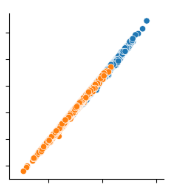

Además, se descartará 'Minor_Axis_Length', su gráfico de densidad demuestra que no divide de la mejor manera las clases de la variable objetivo.

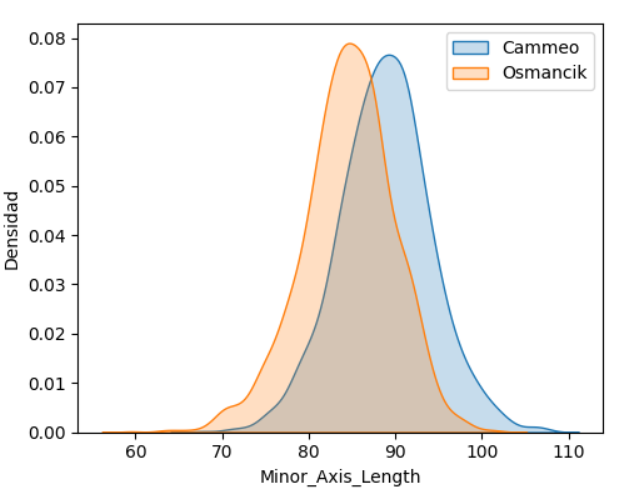

---

# Modelo

Se utilizará el modelo de **árbol de decisión** para clasificar las clases de la variable objetivo.

In [13]:
X = df[['Area',
        'Perimeter',
        'Major_Axis_Length',
        # 'Minor_Axis_Length',
        'Eccentricity',
        # 'Convex_Area',
        'Extent'
        ]]
Y = df['Class']

In [14]:
#@title Particionamiento

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.3, random_state = 0)

In [36]:
#@title Configuracion y entrenamiento del modelo

modelo_dtc = DecisionTreeClassifier(criterion='entropy') #divide los nodos mejorando la pureza hasta llegar a entropía=0
modelo_dtc.fit(X_train, Y_train)



DecisionTreeClassifier(criterion='entropy')

In [37]:
#@title Predicción

Y_pred = modelo_dtc.predict(X_test)

## Métricas


```
Métrica         Fórmula
Precisión       Verdaderos Positivos / (Verdaderos Positivos + Falsos Positivos)
Sensibilidad    Verdaderos Positivos / (Verdaderos Positivos + Falsos Negativos)
F1-score        2 * (Precisión * Sensibilidad) / (Precisión + Sensibilidad)
```


In [17]:
mc_arbol = pd.DataFrame(
    confusion_matrix(Y_test, Y_pred),
    columns=df['Class'].unique(),
    index=df['Class'].unique(),
)

In [18]:
print('Aplicación de fórmulas para Cameo')
accuracy = mc_arbol.iloc[0, 0] / (mc_arbol.iloc[0, 0] + mc_arbol.iloc[1, 0])
recall = mc_arbol.iloc[0, 0] / (mc_arbol.iloc[0, 0] + mc_arbol.iloc[0, 1])
f1_score = 2 * (accuracy * recall) / (accuracy + recall)

print('accuracy = ', round(accuracy, 2))
print('recall   = ', round(recall, 2))
print('f1_score = ', round(f1_score, 2))

print('\nAplicación de fórmulas para Osmancik')
accuracy = mc_arbol.iloc[1, 1] / (mc_arbol.iloc[1, 1] + mc_arbol.iloc[0, 1])
recall = mc_arbol.iloc[1, 1] / (mc_arbol.iloc[1, 1] + mc_arbol.iloc[1, 0])
f1_score = 2 * (accuracy * recall) / (accuracy + recall)

print('accuracy = ', round(accuracy, 2))
print('recall   = ', round(recall, 2))
print('f1_score = ', round(f1_score, 2))

Aplicación de fórmulas para Cameo
accuracy =  0.9
recall   =  0.88
f1_score =  0.89

Aplicación de fórmulas para Osmancik
accuracy =  0.91
recall   =  0.92
f1_score =  0.91


In [19]:
#@title Reporte de métricas

reporte_metricas = classification_report(Y_test, Y_pred)
print(reporte_metricas)

              precision    recall  f1-score   support

      Cammeo       0.90      0.88      0.89       496
    Osmancik       0.91      0.92      0.91       647

    accuracy                           0.90      1143
   macro avg       0.90      0.90      0.90      1143
weighted avg       0.90      0.90      0.90      1143



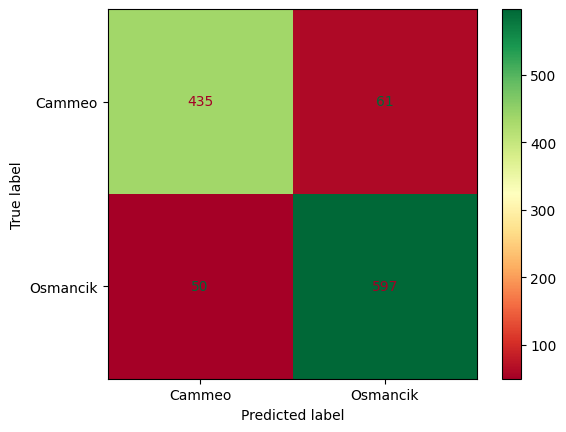

In [23]:
#@title Matriz de confusión

mc_visual = metrics.ConfusionMatrixDisplay(mc_arbol.values,
                                           display_labels = df['Class'].unique())
mc_visual.plot(cmap='RdYlGn')

#Concluciones

La precisión es de 0,9, es decir, clasifica correctamente el 90% de las entradas. La precisión, la sensibilidad y el F1-score son todos superiores al 0,8, lo que significa que el modelo es capaz de predecir correctamente la clase de arroz según las entradas proporcionadas.

El modelo tuvo un rendimiento apenas inferior en la clase 'Cammeo' posiblemente debido a que la clase 'Osmancik' está mas representada en el dataset.

El siguiente código generará el árbol de decisión del modelo. Para una mejor visualización puede descargar la imagen desde la sección de Archivos una vez ejecutado o bien desde el siguiente [link a GitHub](https://github.com/lautarovillalva/AA-EVALUACION/blob/master/modelo_dtc.png).

In [21]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (20,20), dpi=1000)
tree.plot_tree(modelo_dtc,
               feature_names = df.columns[:-1],
               class_names=df['Class'].unique(),
               filled = True);
fig.savefig('modelo_dtc.png')